<h2>This python code for Titanic data with The Survived column is the target variable. If Survival = 1 the passenger survived, otherwise he's dead. The is the variable we're going to predict. The other variables describe the passengers. They are the feature</h1> 



## Lum Kok Keong (P7320307)
## NSDAI2 Class 2 (Thursday)

### References resources used as follow :
   ####    1. https://ahmedbesbes.com/how-to-score-08134-in-titanic-kaggle-challenge.html
   ####    2. https://www.analyticsvidhya.com/blog/2016/01/complete-tutorial-learn-data-science-python-scratch-2/
   ####    3. http://PacktLib.PacktPub.com  - eBook Learning scikit-learn: Machine Learning in Python by Raúl Garreta & Guillermo Moncecchi
 
### We will be using 5 different stages as follow :
####       I - Exploratory data analysis
####      II - Feature engineering
####     III - Modeling
####      IV - Hyperparameters tuning
####       V - Saving the trained Model
####      VI - Submission of test data and results


##         <h1><center>I - Exploratory data analysis</center></h1>           

In [2]:
#=========================================================================
# Import all necessary libraries
#=========================================================================

import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# plot matplotlib graph
%matplotlib inline

#=========================================================================
# Read titanic train data using pandas and first 5 rows of data
#=========================================================================

titanic_df =pd.read_csv('train.csv', sep=',')
titanic_test =pd.read_csv('test.csv', sep=',')

titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [3]:
titanic_test.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


In [4]:
#=========================================================================
# Read titanic train data statistics 
#=========================================================================

titanic_df.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [5]:
titanic_test.describe()

,PassengerId,Pclass,Age,SibSp,Parch,Fare
count,418.000000,418.000000,332.000000,418.000000,418.000000,417.000000
mean,1100.500000,2.265550,30.272590,0.447368,0.392344,35.627188
std,120.810458,0.841838,14.181209,0.896760,0.981429,55.907576
min,892.000000,1.000000,0.170000,0.000000,0.000000,0.000000
25%,996.250000,1.000000,21.000000,0.000000,0.000000,7.895800
50%,1100.500000,3.000000,27.000000,0.000000,0.000000,14.454200
75%,1204.750000,3.000000,39.000000,1.000000,0.000000,31.500000
max,1309.000000,3.000000,76.000000,8.000000,9.000000,512.329200


In [13]:
#=========================================================================================================
# Read titanic train data any missing data 
# The following are the features :
#       PassengerId: and id given to each traveler on the boat
#       Pclass: the passenger class. It has three possible values: 1,2,3 (first, second and third class)
#       The Name of the passeger
#       The Sex
#       The Age
#       SibSp: number of siblings and spouses traveling with the passenger
#       Parch: number of parents and children traveling with the passenger
#       The ticket number
#       The ticket Fare
#       The cabin number
#       The embarkation. This describe three possible areas of the Titanic from which the people embark. 
#                        Three possible values S,C,Q
#
# Survived is the target to be predicted
#
# The count variable shows that 177 values are missing in the Age column, Cabin has 687 missing and 
# Embarked has 2 missing
# 
#=========================================================================================================

titanic_df.count()

PassengerId    891
Survived       891
Pclass         891
Name           891
Sex            891
Age            714
SibSp          891
Parch          891
Ticket         891
Fare           891
Cabin          204
Embarked       889
dtype: int64

In [7]:
titanic_test.count()

PassengerId    418
Pclass         418
Name           418
Sex            418
Age            332
SibSp          418
Parch          418
Ticket         418
Fare           417
Cabin           91
Embarked       418
dtype: int64

In [17]:
# Correlation Details :
# Seems like Parch & SibSp has the highest correlation follow by Age & Pclass
titanic_df.corr()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
PassengerId,1.000000,-0.005007,-0.035144,0.036847,-0.057527,-0.001652,0.012658
Survived,-0.005007,1.000000,-0.338481,-0.077221,-0.035322,0.081629,0.257307
Pclass,-0.035144,-0.338481,1.000000,-0.369226,0.083081,0.018443,-0.549500
Age,0.036847,-0.077221,-0.369226,1.000000,-0.308247,-0.189119,0.096067
SibSp,-0.057527,-0.035322,0.083081,-0.308247,1.000000,0.414838,0.159651
Parch,-0.001652,0.081629,0.018443,-0.189119,0.414838,1.000000,0.216225
Fare,0.012658,0.257307,-0.549500,0.096067,0.159651,0.216225,1.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002563FCD0CC0>,
      dtype=object)

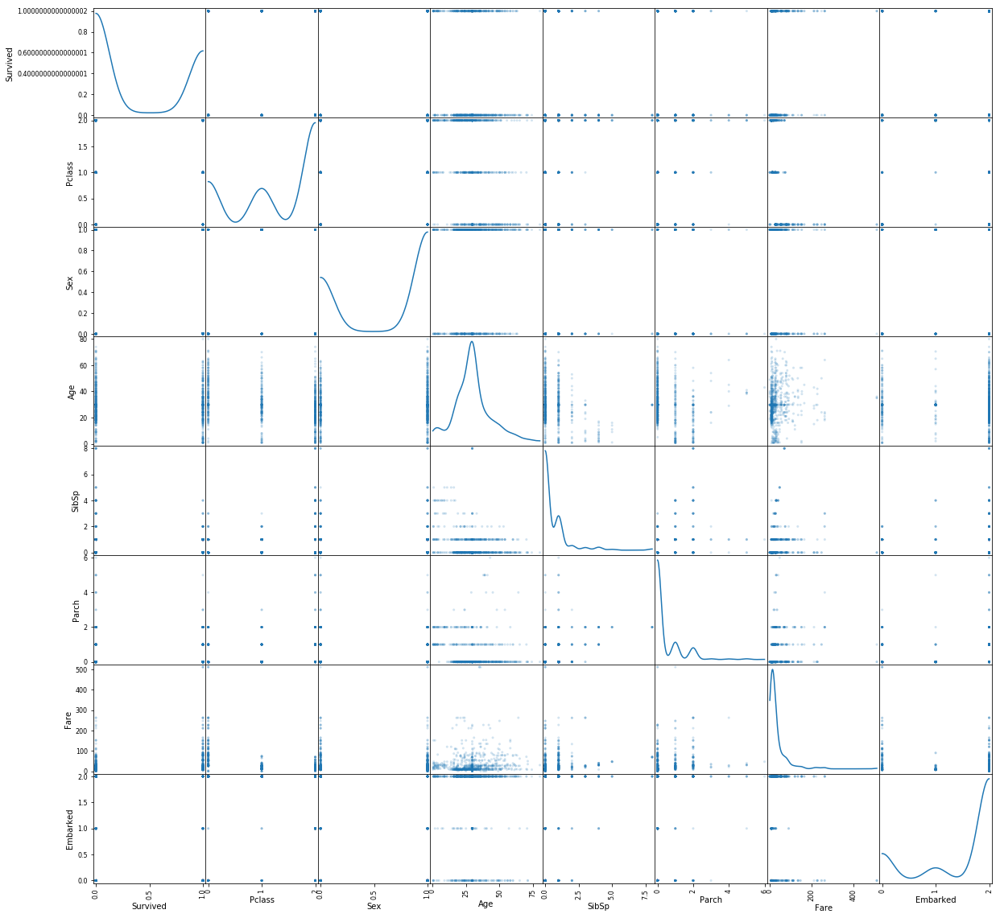

In [92]:
from pandas.plotting import scatter_matrix
scatter_matrix(titanic_df, alpha=0.2, figsize=(20, 20), diagonal='kde')

In [18]:
#=========================================================================
# Analysing Age, Sex, Pclass and survical rate
#=========================================================================

# Train data
print("Train Data")
minAge , maxAge = titanic_df['Age'].min(), titanic_df['Age'].max()
print('Age min : ' + str(minAge) + '\nAge max : ' + str(maxAge))

print('\nSurvival numbers :')
print(titanic_df['Survived'].value_counts())

print('\nSurvival Rates :')
print(titanic_df['Survived'].value_counts() * 100 / len(titanic_df))

print('\nSex :')
print(titanic_df['Sex'].value_counts())

print('\nPclass :')
print(titanic_df['Pclass'].value_counts())

# Test data
print("---------------------------------------------")
print("Test Data")

minAge , maxAge = titanic_test['Age'].min(), titanic_test['Age'].max()
print('Age min : ' + str(minAge) + '\nAge max : ' + str(maxAge))

print('\nSex :')
print(titanic_test['Sex'].value_counts())

print('\nPclass :')
print(titanic_test['Pclass'].value_counts())

Train Data
Age min : 0.42
Age max : 80.0

Survival numbers :
0    549
1    342
Name: Survived, dtype: int64

Survival Rates :
0    61.616162
1    38.383838
Name: Survived, dtype: float64

Sex :
male      577
female    314
Name: Sex, dtype: int64

Pclass :
3    491
1    216
2    184
Name: Pclass, dtype: int64
---------------------------------------------
Test Data
Age min : 0.17
Age max : 76.0

Sex :
male      266
female    152
Name: Sex, dtype: int64

Pclass :
3    218
1    107
2     93
Name: Pclass, dtype: int64


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


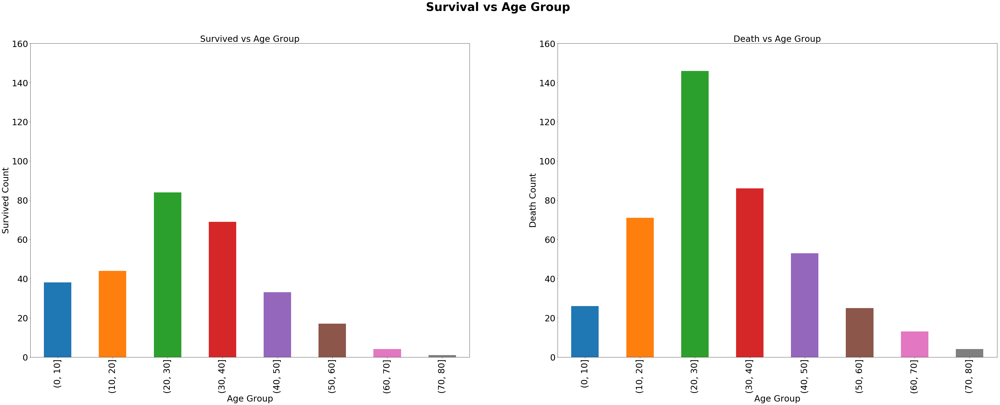

In [19]:
#=========================================================================
# Analysing in details for feature Age survival rate
#=========================================================================

# Since there is too many age numbers to represent in plot, we will use
# age catergory in terms of 10 years and add a new feature column ontot the titanic_df
bins = 0, 10, 20, 30 , 40, 50, 60 ,70 ,80
titanic_df['Age_Cat'] = pd.cut(titanic_df['Age'], bins)

# Ploting two figure side by side
fig = plt.figure(figsize=(60,20)) #  figure


fig.suptitle('Survival vs Age Group', fontsize=40, fontweight='bold')
ax1 = fig.add_subplot(121)
plt.ylim(0,160)
ax1.set_title('Survived vs Age Group', fontsize=30)
ax1.set_xlabel('Age Group', fontsize=30)
ax1.set_ylabel('Survived Count', fontsize=30)
ax1.xaxis.set_tick_params(labelsize=30)
ax1.yaxis.set_tick_params(labelsize=30)
ax2 = fig.add_subplot(122)
plt.ylim(0,160)
ax2.set_title('Death vs Age Group', fontsize=30)
ax2.set_xlabel('Age Group', fontsize=30)
ax2.set_ylabel('Death Count', fontsize=30)
ax2.xaxis.set_tick_params(labelsize=30)
ax2.yaxis.set_tick_params(labelsize=30)

# Plot the survived in terms of Age group
plt.subplot(121) # 1st figure
titanic_df[titanic_df['Survived'] == 1]['Age_Cat'].value_counts().sort_index().plot(kind='bar')

# Plot the not survived in terms of Age group
plt.subplot(122) # 2nd figure
titanic_df[titanic_df['Survived'] == 0]['Age_Cat'].value_counts().sort_index().plot(kind='bar')

# Save the chart to file
plt.savefig("Survial-vs-Age.png", bbox_inches="tight")


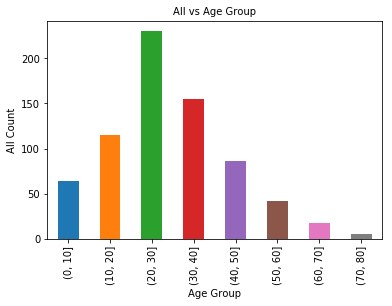

In [20]:
# As can see from above and below bar charts that the age group seems like similiar pattern 
# Hence Age may not be a big weightage as a feature
#
# Plot the not survived in terms of Age group

plt.figure()
plt.title('All vs Age Group', fontsize=10)
plt.xlabel('Age Group', fontsize=10)
plt.ylabel('All Count', fontsize=10)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

titanic_df['Age_Cat'].value_counts().sort_index().plot(kind='bar')

# Save the chart to file
plt.savefig("All-vs-Age.png", bbox_inches="tight")


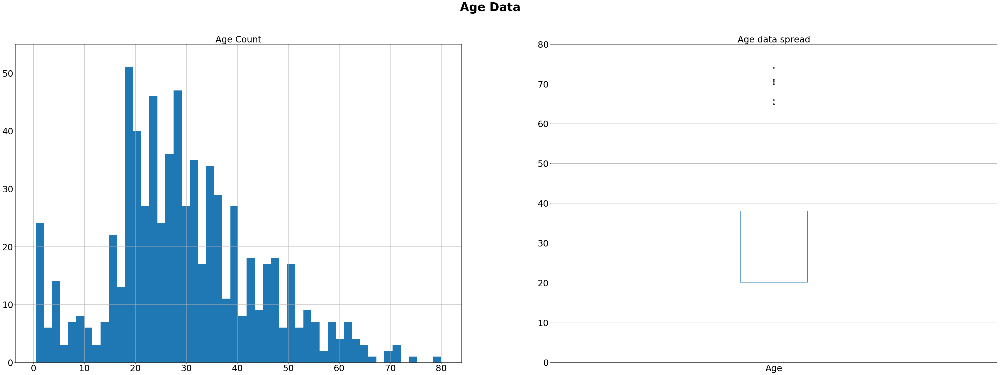

In [21]:
# Checking on Age data spread and Normality

# Ploting two figure side by side
fig = plt.figure(figsize=(60,20)) #  figure
fig.suptitle('Age Data', fontsize=40, fontweight='bold')
ax1 = fig.add_subplot(121)
plt.ylim(0,55)
ax1.set_title('Age Count', fontsize=30)
#ax1.set_xlabel('Age', fontsize=30)
#ax1.set_ylabel('Count', fontsize=30)
ax1.xaxis.set_tick_params(labelsize=30)
ax1.yaxis.set_tick_params(labelsize=30)
ax2 = fig.add_subplot(122)
plt.ylim(0,80)
ax2.set_title('Age data spread', fontsize=30)
#ax2.set_xlabel('Age', fontsize=30)
#ax2.set_ylabel('Year old', fontsize=30)
ax2.xaxis.set_tick_params(labelsize=30)
ax2.yaxis.set_tick_params(labelsize=30)

plt.subplot(121) # 1st figure
titanic_df["Age"].hist(bins=50)

plt.subplot(122) # 2nd figure
titanic_df.boxplot(column='Age')
# Save the chart to file
plt.savefig("Age Data.png", bbox_inches="tight")

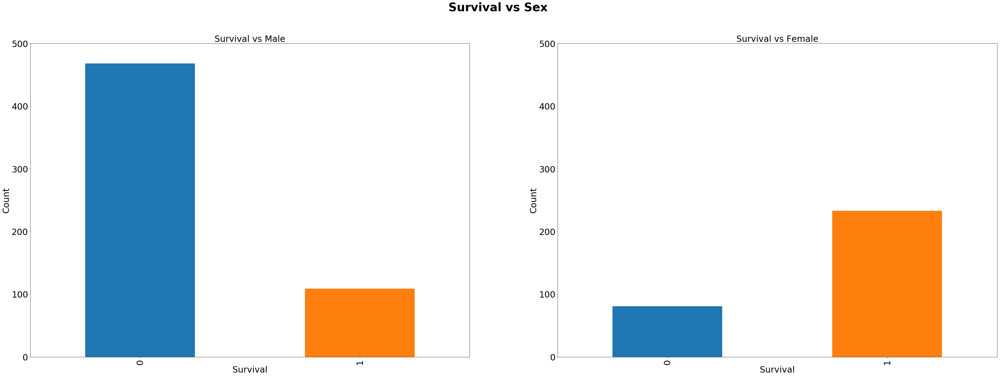

In [22]:
#=========================================================================
# Analysing in details for feature Sex survical rate
#=========================================================================

# Let's visualize survival based on the gender.
# Seems like more female survives than male

# Ploting two figure side by side
fig = plt.figure(figsize=(60,20)) #  figure
fig.suptitle('Survival vs Sex', fontsize=40, fontweight='bold')
ax1 = fig.add_subplot(121)
plt.ylim(0,500)
ax1.set_title('Survival vs Male', fontsize=30)
ax1.set_xlabel('Survival', fontsize=30)
ax1.set_ylabel('Count', fontsize=30)
ax1.xaxis.set_tick_params(labelsize=30)
ax1.yaxis.set_tick_params(labelsize=30)
ax2 = fig.add_subplot(122)
plt.ylim(0,500)
ax2.set_title('Survival vs Female', fontsize=30)
ax2.set_xlabel('Survival', fontsize=30)
ax2.set_ylabel('Count', fontsize=30)
ax2.xaxis.set_tick_params(labelsize=30)
ax2.yaxis.set_tick_params(labelsize=30)

# Plot the survived in terms of Male group
plt.subplot(121) # 1st figure
titanic_df[titanic_df['Sex'] == 'male']['Survived'].value_counts().sort_index().plot(kind='bar')

# Plot the survived in terms of Feale group
plt.subplot(122) # 1st figure
titanic_df[titanic_df['Sex'] == 'female']['Survived'].value_counts().sort_index().plot(kind='bar')

# Save the chart to file
plt.savefig("Survial-vs-Sex.png", bbox_inches="tight")


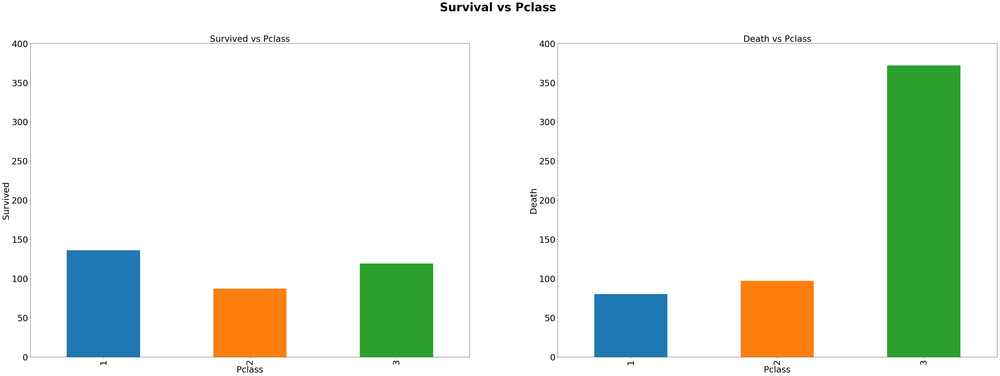

In [23]:
#=========================================================================
# Analysing in details for feature Pclass survival rate
#=========================================================================

# Let's visualize survival based on the Pclass.
# Seems like more Pclass 1 survives than Pclass 3 and Pclass 3 has the highest non survival rate

# Ploting two figure side by side
fig = plt.figure(figsize=(60,20)) #  figure
fig.suptitle('Survival vs Pclass', fontsize=40, fontweight='bold')
ax1 = fig.add_subplot(121)
plt.ylim(0,400)
ax1.set_title('Survived vs Pclass', fontsize=30)
ax1.set_xlabel('Pclass', fontsize=30)
ax1.set_ylabel('Survived', fontsize=30)
ax1.xaxis.set_tick_params(labelsize=30)
ax1.yaxis.set_tick_params(labelsize=30)
ax2 = fig.add_subplot(122)
plt.ylim(0,400)
ax2.set_title('Death vs Pclass', fontsize=30)
ax2.set_xlabel('Pclass', fontsize=30)
ax2.set_ylabel('Death', fontsize=30)
ax2.xaxis.set_tick_params(labelsize=30)
ax2.yaxis.set_tick_params(labelsize=30)

# Plot the survived in terms of Male group
plt.subplot(121) # 1st figure
titanic_df[titanic_df['Survived'] == 1]['Pclass'].value_counts().sort_index().plot(kind='bar')

# Plot the survived in terms of Feale group
plt.subplot(122) # 1st figure
titanic_df[titanic_df['Survived'] == 0]['Pclass'].value_counts().sort_index().plot(kind='bar')

# Save the chart to file
plt.savefig("Survial-vs-Pclass.png", bbox_inches="tight")

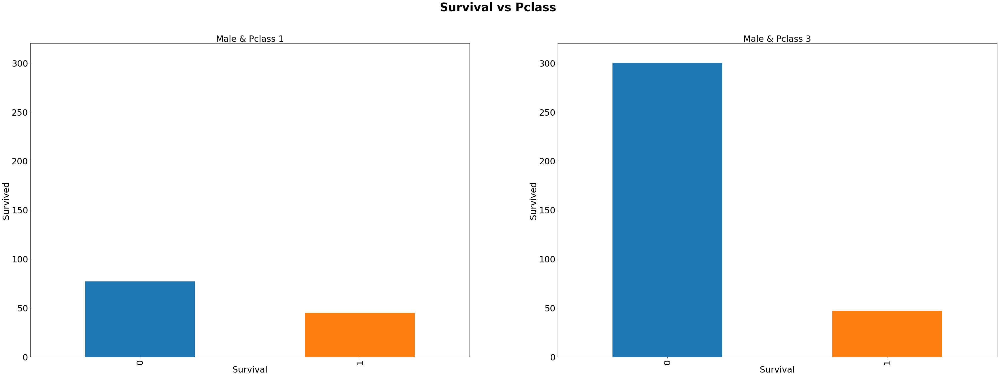

In [24]:
#=========================================================================
# Analysing in details for combined feature Pclass & Sex survical rate
#=========================================================================

# Let's visualize survival based on the Pclass & Sex.
# Seems like more Male in Pclass 3 has highest non survival rate

# Ploting two figure side by side
fig = plt.figure(figsize=(60,20)) #  figure
fig.suptitle('Survival vs Pclass', fontsize=40, fontweight='bold')
ax1 = fig.add_subplot(121)
plt.ylim(0,320)
ax1.set_title('Male & Pclass 1', fontsize=30)
ax1.set_xlabel('Survival', fontsize=30)
ax1.set_ylabel('Survived', fontsize=30)
ax1.xaxis.set_tick_params(labelsize=30)
ax1.yaxis.set_tick_params(labelsize=30)
ax2 = fig.add_subplot(122)
plt.ylim(0,320)
ax2.set_title('Male & Pclass 3', fontsize=30)
ax2.set_xlabel('Survival', fontsize=30)
ax2.set_ylabel('Survived', fontsize=30)
ax2.xaxis.set_tick_params(labelsize=30)
ax2.yaxis.set_tick_params(labelsize=30)

# Plot the survived in terms of Male group
plt.subplot(121) # 1st figure
titanic_df[(titanic_df['Sex'] == 'male') & (titanic_df['Pclass'] == 1)]['Survived'].value_counts().sort_index().plot(kind='bar')

# Plot the survived in terms of Feale group
plt.subplot(122) # 1st figure
titanic_df[(titanic_df['Sex'] == 'male') & (titanic_df['Pclass'] == 3)]['Survived'].value_counts().sort_index().plot(kind='bar')

# Save the chart to file
plt.savefig("Male-Pclass1-3.png", bbox_inches="tight")

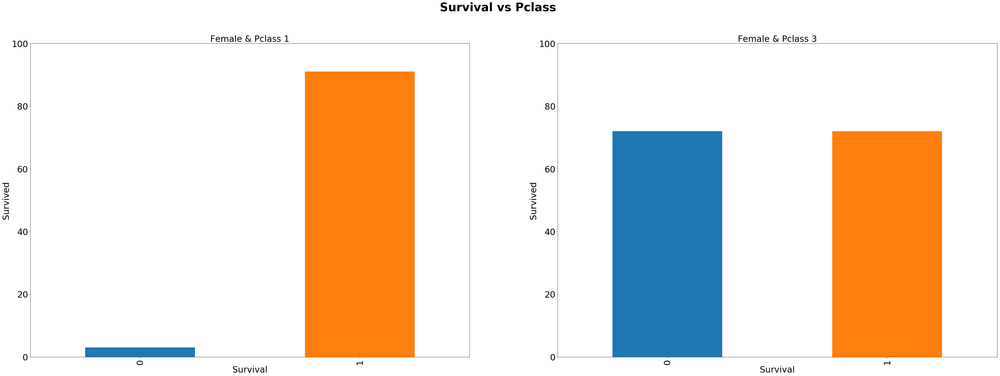

In [25]:
# Let's visualize survival based on the Pclass & Sex.
# Seems like more Feale in Pclass 1 has highest survival rate and 50% survival rate in Pclass 3

# Ploting two figure side by side
fig = plt.figure(figsize=(60,20)) #  figure
fig.suptitle('Survival vs Pclass', fontsize=40, fontweight='bold')
ax1 = fig.add_subplot(121)
plt.ylim(0,100)
ax1.set_title('Female & Pclass 1', fontsize=30)
ax1.set_xlabel('Survival', fontsize=30)
ax1.set_ylabel('Survived', fontsize=30)
ax1.xaxis.set_tick_params(labelsize=30)
ax1.yaxis.set_tick_params(labelsize=30)
ax2 = fig.add_subplot(122)
plt.ylim(0,100)
ax2.set_title('Female & Pclass 3', fontsize=30)
ax2.set_xlabel('Survival', fontsize=30)
ax2.set_ylabel('Survived', fontsize=30)
ax2.xaxis.set_tick_params(labelsize=30)
ax2.yaxis.set_tick_params(labelsize=30)

# Plot the survived in terms of Male group
plt.subplot(121) # 1st figure
titanic_df[(titanic_df['Sex'] == 'female') & (titanic_df['Pclass'] == 1)]['Survived'].value_counts().sort_index().plot(kind='bar')

# Plot the survived in terms of Feale group
plt.subplot(122) # 1st figure
titanic_df[(titanic_df['Sex'] == 'female') & (titanic_df['Pclass'] == 3)]['Survived'].value_counts().sort_index().plot(kind='bar')

# Save the chart to file
plt.savefig("Female-Pclass1-3.png", bbox_inches="tight")

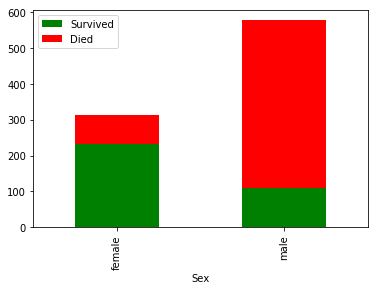

In [26]:
#=========================================================================
# Analysing in details for combined feature Age & Sex survical rate
#=========================================================================

# Let's visualize survival based on the gender & Age.
# It looks like male passengers are more likely to succumb.
# The Sex variable seems to be a discriminative feature. Women are more likely to survive.

titanic_df['Died'] = 1 - titanic_df['Survived']
titanic_df.groupby('Sex').agg('sum')[['Survived', 'Died']].plot(kind='bar',stacked=True, color=['g', 'r']);



C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


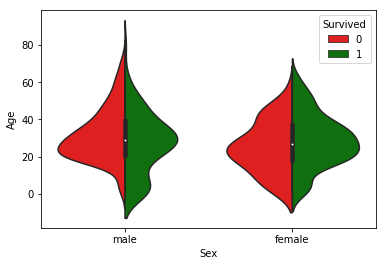

In [27]:
# Let's now correlate the survival with the age variable.
# Women survive more than men, as depicted by the larger female green histogram
import seaborn as sns

fig = plt.figure()
sns.violinplot(x='Sex', y='Age', 
               hue='Survived', data=titanic_df, 
               split=True,
               palette={0: "r", 1: "g"}
              );


##       <h1><center>II - Feature engineering</center></h1>            

In [28]:
#*************************************************************************
#               Processing Missing Data
#*************************************************************************

# Processing the train ages
# Age variable was missing 177 values. This is a large number. Simply 
# replacing them with the mean age 

print(titanic_df['Age'].isnull().sum())
# replace ns with the mean value
titanic_df['Age'].fillna(titanic_df['Age'].mean(), inplace=True)

titanic_df.count()

177


PassengerId    891
Survived       891
Pclass         891
Name           891
Sex            891
Age            891
SibSp          891
Parch          891
Ticket         891
Fare           891
Cabin          204
Embarked       889
Age_Cat        714
Died           891
dtype: int64

In [29]:
# Processing the train Embarked
# Embarked variable has missing 2 values. This is a small number. Simply 
# replacing them with the mode age 

print(titanic_df['Embarked'].isnull().sum())
# replace ns with the mean value
titanic_df['Embarked'].fillna(titanic_df['Embarked'].mode()[0], inplace=True)

titanic_df.count()


2


PassengerId    891
Survived       891
Pclass         891
Name           891
Sex            891
Age            891
SibSp          891
Parch          891
Ticket         891
Fare           891
Cabin          204
Embarked       891
Age_Cat        714
Died           891
dtype: int64

In [30]:
# Since Cabin has large numbers of missing values, in both train and 
# test data set , we will drop this column
# As PassengerId, Name and Ticket Number will not make sense as a 
# affecting factor to the survival rate

titanic_df = titanic_df.drop(['PassengerId','Name','Ticket','Cabin','Age_Cat','Died'], axis=1)


In [31]:
# Since, sklearn requires all inputs to be numeric, we should convert all 
# our categorical variables into numeric by encoding the categories. Before
# that we will fill all the missing values in the dataset. This can be done 
# using the following code: 

# For train data
from sklearn.preprocessing import LabelEncoder
var_mod = ['Pclass','Sex','Embarked']
le = LabelEncoder()
for i in var_mod:
    titanic_df[i] = le.fit_transform(titanic_df[i])
titanic_df.dtypes 

Survived      int64
Pclass        int64
Sex           int32
Age         float64
SibSp         int64
Parch         int64
Fare        float64
Embarked      int32
dtype: object

In [32]:
titanic_df.head()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0,2,1,22.0,1,0,7.2500,2
1,1,0,0,38.0,1,0,71.2833,0
2,1,2,0,26.0,0,0,7.9250,2
3,1,0,0,35.0,1,0,53.1000,2
4,0,2,1,35.0,0,0,8.0500,2


#        <h1><center>III - Modeling</center></h1> 

In [36]:
#=========================================================================
# Next, we will import the required modules. Then we will define a generic 
# classification function, which takes a model as input and determines the 
# Accuracy and Cross-Validation scores.
#=========================================================================

#Import models from scikit learn module:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold   #For K-fold cross validation
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble.gradient_boosting import GradientBoostingClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.dummy import DummyClassifier
from sklearn import linear_model
from sklearn import metrics 
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve, auc

#Generic function for making a classification model and accessing performance:

def compute_score(clf, X, y, scoring='accuracy'):
    xval = cross_val_score(clf, X, y, cv = 5, scoring=scoring)
    return np.mean(xval)

#-----------------------------------------------------------------
# Function for Logistic Regression
#-----------------------------------------------------------------
def classification_model_Log(model, data, predictors, outcome):
  #Fit the model:
  model.fit(data[predictors],data[outcome])
  coef = model.coef_[0]
  print (coef)

  #Make predictions on training set:
  predictions = model.predict(data[predictors])

  # Plot the ROC Curve
  ROC_Title = "Receiver Operating Characteristic for\n" + str(model.__class__)
  false_positive_rate, recall, thresholds = roc_curve(data[outcome],predictions)
  roc_auc = auc(false_positive_rate, recall)
  plt.title(ROC_Title)
  plt.plot(false_positive_rate, recall, 'b', label='AUC = %0.2f' %roc_auc)
  plt.legend(loc='lower right')
  plt.plot([0, 1], [0, 1], 'r--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.0])
  plt.ylabel('Recall')
  plt.xlabel('Fall-out')
  plt.show()

  # Get performance metrics
  cm = confusion_matrix(data[outcome],predictions)
  f1 = f1_score(data[outcome], predictions)
  accuracy = metrics.accuracy_score(predictions,data[outcome])
  precision = metrics.precision_score(predictions,data[outcome])
  recall = metrics.recall_score(predictions,data[outcome])
  score = compute_score(clf=model, X=data[predictors], y=data[outcome], scoring='accuracy')
  r2_score = metrics.r2_score(data[outcome],predictions)
    
  # Print performance metrics

  print ('*************************************************************')
  print ('Metric Performance of : {0}\n'.format(model.__class__))
  print ('Confusion Matrix : \n', cm)
  print(metrics.classification_report(data[outcome], predictions))
  print ("\nF1 Score :  %s" % "{0:.3%}".format(f1))
  print ("Accuracy : %s" % "{0:.3%}".format(accuracy))
  print ("Precision : %s" % "{0:.3%}".format(precision))
  print ("Recall : %s" % "{0:.3%}".format(recall))
  print ('Cross Validation Score = {0:.3%}\n'.format(score))
  print ("Coefficient of determination:{0:.3f}".format(r2_score))

  #Perform k-fold cross-validation with 10 folds
  kf = KFold(n_splits=10, shuffle=True,random_state=None)
  error = []

  for train, test in kf.split(data[predictors]):
    # Filter training data
    train_predictors = (data[predictors].iloc[train,:])
    
    # The target we're using to train the algorithm.
    train_target = data[outcome].iloc[train]
    
    # Training the algorithm using the predictors and target.
    model.fit(train_predictors, train_target)
     
    #Record error from each cross-validation run
    error.append(model.score(data[predictors].iloc[test,:], data[outcome].iloc[test]))
  
  #Make KFold predictions on training set:
  predictions = model.predict(train_predictors)
  print ('*************************************************************')
  print ('KFold Classification Report : ')
  print(metrics.classification_report(train_target, predictions))
  print ("\nCoefficient of determination:{0:.3f}".format(metrics.r2_score(train_target, predictions)))
  print ("\nCross-Validation Score (mean) : %s" % "{0:.3%}\n".format(np.mean(error)))
  print ('*************************************************************')

  #Fit the model again so that it can be refered outside the function:
  model.fit(data[predictors],data[outcome]) 

#-----------------------------------------------------------------
# Function for Random Decision Tree, Decision Tree CLassifier, 
# Random Forest Classifier and Gradient Boosting CLassifier
#-----------------------------------------------------------------
def classification_model_RanTree(model, data, predictors, outcome):
  #Fit the model:
  model.fit(data[predictors],data[outcome])
    
  #Make predictions on training set:
  predictions = model.predict(data[predictors])

  # Plot the ROC Curve
  ROC_Title = "Receiver Operating Characteristic for\n" + str(model.__class__)
  false_positive_rate, recall, thresholds = roc_curve(data[outcome],predictions)
  roc_auc = auc(false_positive_rate, recall)
  plt.title(ROC_Title)
  plt.plot(false_positive_rate, recall, 'b', label='AUC = %0.2f' %roc_auc)
  plt.legend(loc='lower right')
  plt.plot([0, 1], [0, 1], 'r--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.0])
  plt.ylabel('Recall')
  plt.xlabel('Fall-out')
  plt.show()

  # Get performance metrics
  cm = confusion_matrix(data[outcome],predictions)
  print(metrics.classification_report(data[outcome], predictions))
  f1 = f1_score(data[outcome], predictions)
  accuracy = metrics.accuracy_score(predictions,data[outcome])
  precision = metrics.precision_score(predictions,data[outcome])
  recall = metrics.recall_score(predictions,data[outcome])
  score = compute_score(clf=model, X=data[predictors], y=data[outcome], scoring='accuracy')
  r2_score = metrics.r2_score(data[outcome],predictions)
    
  # Print performance metrics

  print ('*************************************************************')
  print ('Metric Performance of : {0}\n'.format(model.__class__))
  print('Confusion Matrix : \n', cm)
  print("\nF1 Score :  %s" % "{0:.3%}".format(f1))
  print ("Accuracy : %s" % "{0:.3%}".format(accuracy))
  print ("Precision : %s" % "{0:.3%}".format(precision))
  print ("Recall : %s" % "{0:.3%}".format(recall))
  print ('Cross Validation Score = {0:.3%}\n'.format(score))
  print ("Coefficient of determination:{0:.3f}".format(r2_score))

  #Perform k-fold cross-validation with 10 folds
  kf = KFold(n_splits=10, shuffle=True,random_state=None)
  error = []

  for train, test in kf.split(data[predictors]):
    # Filter training data
    train_predictors = (data[predictors].iloc[train,:])
    
    # The target we're using to train the algorithm.
    train_target = data[outcome].iloc[train]
    
    # Training the algorithm using the predictors and target.
    model.fit(train_predictors, train_target)
    
    #Record error from each cross-validation run
    error.append(model.score(data[predictors].iloc[test,:], data[outcome].iloc[test]))
  
  #Make KFold predictions on training set:
  predictions = model.predict(train_predictors)
  print ('*************************************************************')
  print ('KFold Classification Report : ')
  print(metrics.classification_report(train_target, predictions))
  print ("\nCoefficient of determination:{0:.3f}".format(metrics.r2_score(train_target, predictions)))
  print ("Cross-Validation Score (mean) : %s" % "{0:.3%}\n".format(np.mean(error)))
  print ('*************************************************************')
      
  #Fit the model again so that it can be refered outside the function:
  model.fit(data[predictors],data[outcome]) 
    
#-----------------------------------------------------------------
# Function for Random Forest Regressor
#-----------------------------------------------------------------
def classification_model_RanForest(model, data, predictors, outcome):
  #Fit the model:
  model.fit(data[predictors],data[outcome])
   
  print ('*************************************************************')
  #Make predictions on training set:
  predictions = model.predict(data[predictors])

  # Plot the ROC Curve
  ROC_Title = "Receiver Operating Characteristic for\n" + str(model.__class__)
  false_positive_rate, recall, thresholds = roc_curve(data[outcome],predictions)
  roc_auc = auc(false_positive_rate, recall)
  plt.title(ROC_Title)
  plt.plot(false_positive_rate, recall, 'b', label='AUC = %0.2f' %roc_auc)
  plt.legend(loc='lower right')
  plt.plot([0, 1], [0, 1], 'r--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.0])
  plt.ylabel('Recall')
  plt.xlabel('Fall-out')
  plt.show()

  r2_score = metrics.r2_score(data[outcome],predictions)
        
  # Print performance metrics

  print ('*************************************************************')
  print ('Metric Performance of : {0}\n'.format(model.__class__))
  print ('Cross-validation of : {0}'.format(model.oob_score_ ))
  print ("Coefficient of determination:{0:.3f}".format(r2_score))  
    
  #Perform k-fold cross-validation with 10 folds
  kf = KFold(n_splits=10, shuffle=True,random_state=None)
  error = []

  for train, test in kf.split(data[predictors]):
    # Filter training data
    train_predictors = (data[predictors].iloc[train,:])
    
    # The target we're using to train the algorithm.
    train_target = data[outcome].iloc[train]
    
    # Training the algorithm using the predictors and target.
    model.fit(train_predictors, train_target)
    
    #Record error from each cross-validation run
    error.append(model.score(data[predictors].iloc[test,:], data[outcome].iloc[test]))
  

  #Make KFold predictions on training set:
  predictions = model.predict(train_predictors)
  print ('*************************************************************')
  print ('KFold Classification Report : ')
  print ("\nCoefficient of determination:{0:.3f}".format(metrics.r2_score(train_target, predictions))) 
  print ("Cross-Validation Score (mean) : %s" % "{0:.3%}\n".format(np.mean(error)))
  print ('*************************************************************')  
    
  #Fit the model again so that it can be refered outside the function:
  model.fit(data[predictors],data[outcome]) 


In [37]:
# Checking on the feature importance weightage
from sklearn.metrics import confusion_matrix

def features_importance(clf, data, predictors, outcome):
    target = data[outcome]
    train = data[predictors]

    clf = clf.fit(train,target)
    
    features = pd.DataFrame()
    features['feature'] = train.columns
    features['importance'] = clf.feature_importances_
    features.sort_values(by=['importance'], ascending=True, inplace=True)
    features.set_index('feature', inplace=True)
    print ('*************************************************************')
    features.plot(title = 'Features Importance',fontsize= 30, kind='barh', figsize=(50, 10))
    featimp = pd.Series(clf.feature_importances_, index=predictors).sort_values(ascending=False)
    print (featimp)
    print('\n**********************************************************')

In [38]:
#******************************************************************************
# Testing of features ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
#******************************************************************************

[-1.04892369e+00 -2.63187598e+00 -3.85043304e-02 -3.17801116e-01
 -8.95934823e-02  2.13607183e-03 -2.19547868e-01]


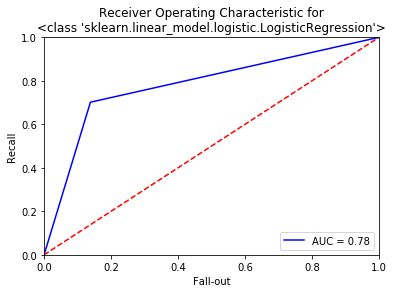

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:757: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:757: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:757: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


*************************************************************
Metric Performance of : <class 'sklearn.linear_model.logistic.LogisticRegression'>

Confusion Matrix : 
 [[473  76]
 [102 240]]
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       549
           1       0.76      0.70      0.73       342

   micro avg       0.80      0.80      0.80       891
   macro avg       0.79      0.78      0.79       891
weighted avg       0.80      0.80      0.80       891


F1 Score :  72.948%
Accuracy : 80.022%
Precision : 70.175%
Recall : 75.949%
Cross Validation Score = 78.568%

Coefficient of determination:0.155
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       492
           1       0.77      0.71      0.73       310

   micro avg       0.80      0.80      0.80       802
   macro avg       0.79   

In [39]:
# Logistic Regression test

outcome_var = 'Survived'
model = LogisticRegression(solver='lbfgs')
predictor_var = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
classification_model_Log(model, titanic_df,predictor_var,outcome_var)


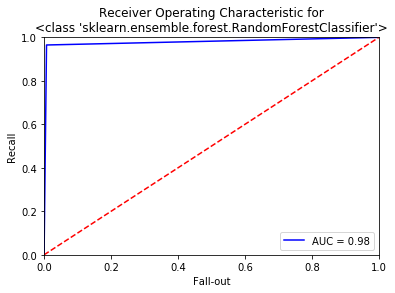

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       549
           1       0.99      0.96      0.98       342

   micro avg       0.98      0.98      0.98       891
   macro avg       0.98      0.98      0.98       891
weighted avg       0.98      0.98      0.98       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestClassifier'>

Confusion Matrix : 
 [[545   4]
 [ 12 330]]

F1 Score :  97.633%
Accuracy : 98.204%
Precision : 96.491%
Recall : 98.802%
Cross Validation Score = 81.487%

Coefficient of determination:0.924
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       499
           1       0.99      0.97      0.98       303

   micro avg       0.98      0.98      0.98       802
   macro avg       0.98     

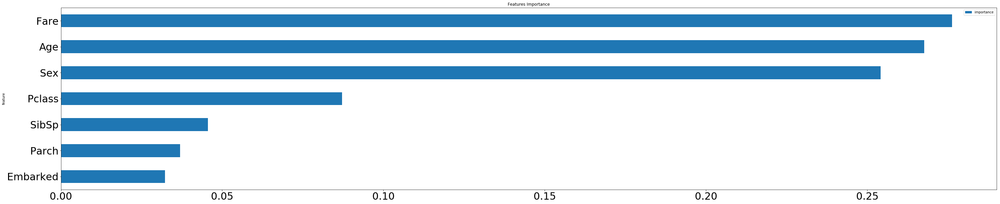

In [40]:
model = RandomForestClassifier(n_estimators=100)
predictor_var = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
outcome_var = 'Survived'

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)
features_importance(model, titanic_df,predictor_var,outcome_var)

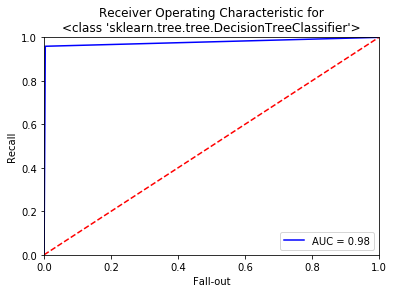

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       549
           1       0.99      0.96      0.98       342

   micro avg       0.98      0.98      0.98       891
   macro avg       0.98      0.98      0.98       891
weighted avg       0.98      0.98      0.98       891

*************************************************************
Metric Performance of : <class 'sklearn.tree.tree.DecisionTreeClassifier'>

Confusion Matrix : 
 [[547   2]
 [ 14 328]]

F1 Score :  97.619%
Accuracy : 98.204%
Precision : 95.906%
Recall : 99.394%
Cross Validation Score = 76.998%

Coefficient of determination:0.924
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       503
           1       0.99      0.96      0.98       299

   micro avg       0.98      0.98      0.98       802
   macro avg       0.98      0.98 

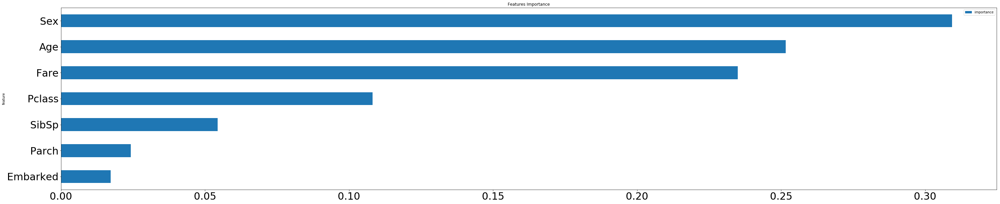

In [41]:
# Decision Tree Classifier test

outcome_var = 'Survived'
model = DecisionTreeClassifier()
predictor_var = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)
features_importance(model, titanic_df,predictor_var,outcome_var)

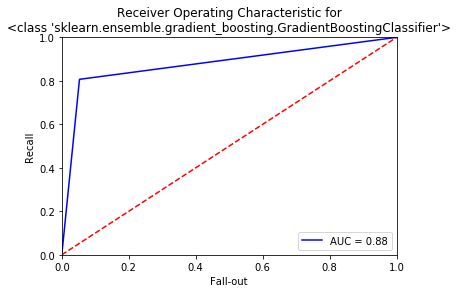

              precision    recall  f1-score   support

           0       0.89      0.95      0.92       549
           1       0.90      0.81      0.85       342

   micro avg       0.89      0.89      0.89       891
   macro avg       0.90      0.88      0.88       891
weighted avg       0.89      0.89      0.89       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.gradient_boosting.GradientBoostingClassifier'>

Confusion Matrix : 
 [[520  29]
 [ 66 276]]

F1 Score :  85.317%
Accuracy : 89.338%
Precision : 80.702%
Recall : 90.492%
Cross Validation Score = 82.722%

Coefficient of determination:0.549
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.88      0.97      0.92       494
           1       0.94      0.80      0.86       308

   micro avg       0.90      0.90      0.90       802
   macro avg 

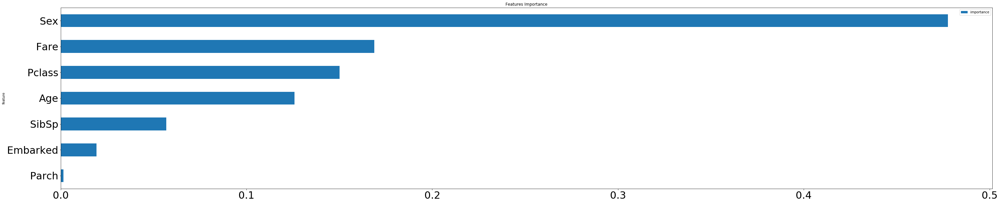

In [42]:
# Gradient Boosting Classifier test

outcome_var = 'Survived'
model = GradientBoostingClassifier()
predictor_var = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)
features_importance(model, titanic_df,predictor_var,outcome_var)

*************************************************************


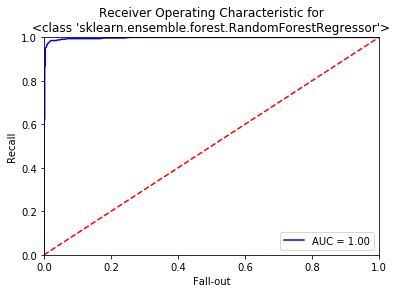

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestRegressor'>

Cross-validation of : 0.40335421507284364
Coefficient of determination:0.886
*************************************************************
KFold Classification Report : 

Coefficient of determination:0.875
Cross-Validation Score (mean) : 39.442%

*************************************************************
*************************************************************
Sex         0.305872
Age         0.248687
Fare        0.244605
Pclass      0.103627
SibSp       0.047251
Embarked    0.027984
Parch       0.021973
dtype: float64

**********************************************************


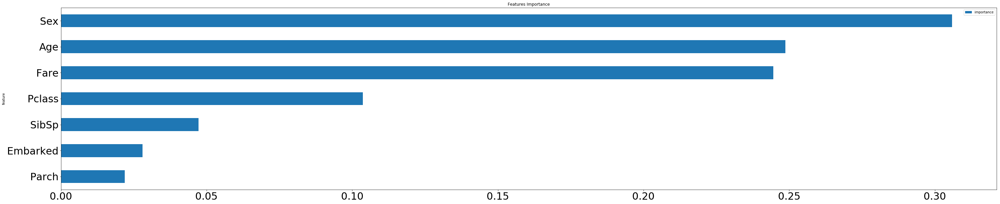

In [43]:
# Random Forest Regressor test

outcome_var = 'Survived'
model = RandomForestRegressor(n_estimators=100,oob_score=True)
predictor_var = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']

classification_model_RanForest(model, titanic_df,predictor_var,outcome_var)
features_importance(model, titanic_df,predictor_var,outcome_var)

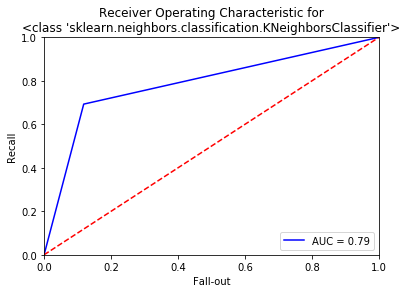

              precision    recall  f1-score   support

           0       0.82      0.88      0.85       549
           1       0.78      0.69      0.74       342

   micro avg       0.81      0.81      0.81       891
   macro avg       0.80      0.79      0.79       891
weighted avg       0.81      0.81      0.81       891

*************************************************************
Metric Performance of : <class 'sklearn.neighbors.classification.KNeighborsClassifier'>

Confusion Matrix : 
 [[484  65]
 [105 237]]

F1 Score :  73.602%
Accuracy : 80.920%
Precision : 69.298%
Recall : 78.477%
Cross Validation Score = 69.709%

Coefficient of determination:0.193
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.81      0.88      0.84       498
           1       0.77      0.66      0.71       304

   micro avg       0.80      0.80      0.80       802
   macro avg       0.

In [44]:
# K Nearest Neigbour test

model = KNeighborsClassifier()
predictor_var = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
outcome_var = 'Survived'

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)

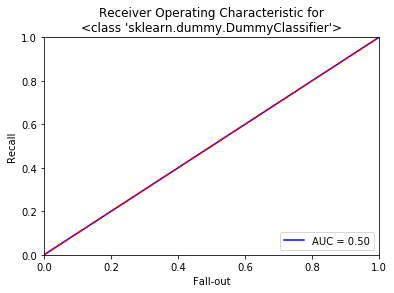

              precision    recall  f1-score   support

           0       0.62      0.63      0.62       549
           1       0.38      0.37      0.38       342

   micro avg       0.53      0.53      0.53       891
   macro avg       0.50      0.50      0.50       891
weighted avg       0.53      0.53      0.53       891

*************************************************************
Metric Performance of : <class 'sklearn.dummy.DummyClassifier'>

Confusion Matrix : 
 [[345 204]
 [215 127]]

F1 Score :  37.741%
Accuracy : 52.974%
Precision : 37.135%
Recall : 38.369%
Cross Validation Score = 52.860%

Coefficient of determination:-0.988
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.61      0.62      0.61       494
           1       0.37      0.36      0.36       308

   micro avg       0.52      0.52      0.52       802
   macro avg       0.49      0.49      0.49 

In [45]:
# Dummy test

model = DummyClassifier(strategy='stratified') # strategy in ['stratified', 'most_frequent', 'prior', 'uniform']
predictor_var = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
outcome_var = 'Survived'

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)

In [46]:
#******************************************************************************
# Testing of features ['Pclass','Sex','Age','Fare']
#******************************************************************************

[-1.11287125e+00 -2.51282396e+00 -3.25956393e-02  8.06647914e-04]


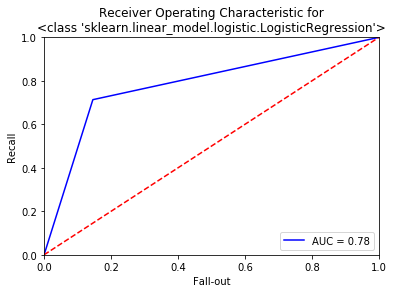

*************************************************************
Metric Performance of : <class 'sklearn.linear_model.logistic.LogisticRegression'>

Confusion Matrix : 
 [[469  80]
 [ 98 244]]
              precision    recall  f1-score   support

           0       0.83      0.85      0.84       549
           1       0.75      0.71      0.73       342

   micro avg       0.80      0.80      0.80       891
   macro avg       0.79      0.78      0.79       891
weighted avg       0.80      0.80      0.80       891


F1 Score :  73.273%
Accuracy : 80.022%
Precision : 71.345%
Recall : 75.309%
Cross Validation Score = 78.678%

Coefficient of determination:0.155
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.83      0.85      0.84       502
           1       0.74      0.70      0.72       300

   micro avg       0.80      0.80      0.80       802
   macro avg       0.79   

In [47]:
# Logistic Regression test

outcome_var = 'Survived'
model = LogisticRegression(solver='lbfgs')
predictor_var = ['Pclass','Sex','Age','Fare']
classification_model_Log(model, titanic_df,predictor_var,outcome_var)


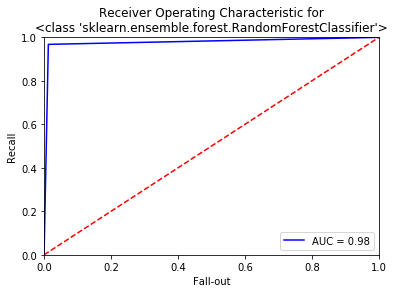

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       549
           1       0.98      0.97      0.97       342

   micro avg       0.98      0.98      0.98       891
   macro avg       0.98      0.98      0.98       891
weighted avg       0.98      0.98      0.98       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestClassifier'>

Confusion Matrix : 
 [[542   7]
 [ 11 331]]

F1 Score :  97.353%
Accuracy : 97.980%
Precision : 96.784%
Recall : 97.929%
Cross Validation Score = 81.603%

Coefficient of determination:0.915
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       492
           1       0.98      0.98      0.98       310

   micro avg       0.98      0.98      0.98       802
   macro avg       0.98     

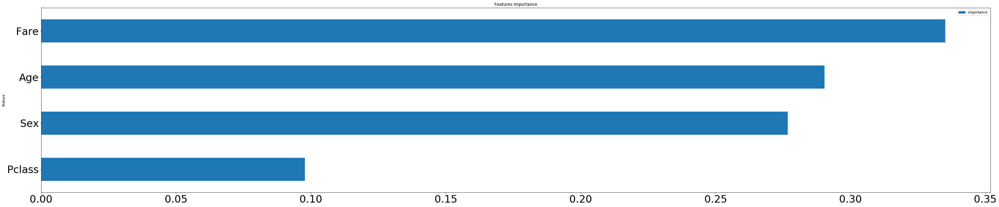

In [48]:
model = RandomForestClassifier(n_estimators=100)
predictor_var = ['Pclass','Sex','Age','Fare']
outcome_var = 'Survived'

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)
features_importance(model, titanic_df,predictor_var,outcome_var)

print(model)

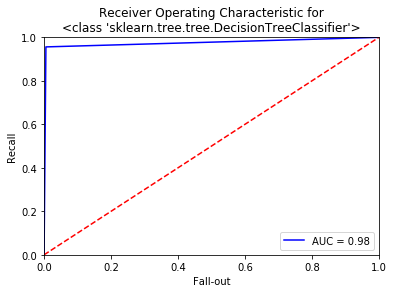

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       549
           1       0.99      0.96      0.97       342

   micro avg       0.98      0.98      0.98       891
   macro avg       0.98      0.98      0.98       891
weighted avg       0.98      0.98      0.98       891

*************************************************************
Metric Performance of : <class 'sklearn.tree.tree.DecisionTreeClassifier'>

Confusion Matrix : 
 [[546   3]
 [ 15 327]]

F1 Score :  97.321%
Accuracy : 97.980%
Precision : 95.614%
Recall : 99.091%
Cross Validation Score = 77.786%

Coefficient of determination:0.915
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.97      1.00      0.98       491
           1       1.00      0.95      0.97       311

   micro avg       0.98      0.98      0.98       802
   macro avg       0.98      0.97 

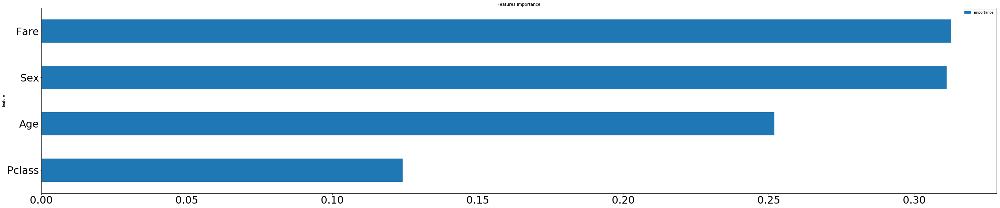

In [49]:
# Decision Tree Classifier test

outcome_var = 'Survived'
model = DecisionTreeClassifier()
predictor_var = ['Pclass','Sex','Age','Fare']

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)
features_importance(model, titanic_df,predictor_var,outcome_var)

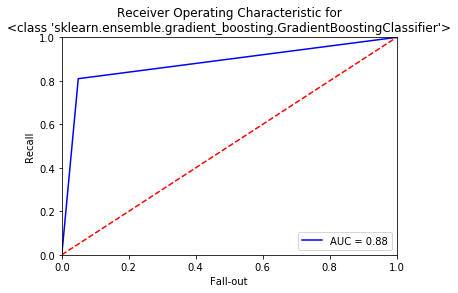

              precision    recall  f1-score   support

           0       0.89      0.95      0.92       549
           1       0.91      0.81      0.86       342

   micro avg       0.90      0.90      0.90       891
   macro avg       0.90      0.88      0.89       891
weighted avg       0.90      0.90      0.90       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.gradient_boosting.GradientBoostingClassifier'>

Confusion Matrix : 
 [[522  27]
 [ 65 277]]

F1 Score :  85.759%
Accuracy : 89.675%
Precision : 80.994%
Recall : 91.118%
Cross Validation Score = 83.283%

Coefficient of determination:0.563
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.89      0.95      0.92       492
           1       0.91      0.81      0.86       310

   micro avg       0.90      0.90      0.90       802
   macro avg 

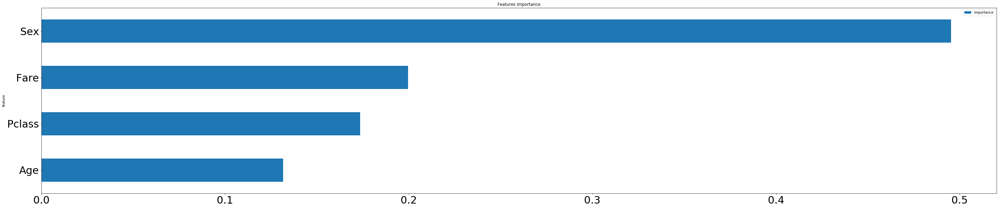

In [50]:
# Gradient Boosting Classifier test

outcome_var = 'Survived'
model = GradientBoostingClassifier()
predictor_var = ['Pclass','Sex','Age','Fare']

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)
features_importance(model, titanic_df,predictor_var,outcome_var)

*************************************************************


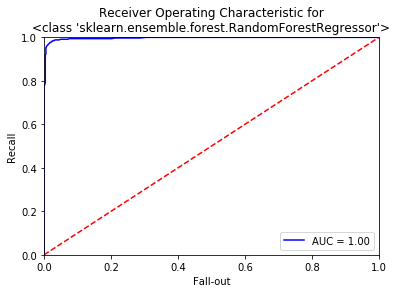

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestRegressor'>

Cross-validation of : 0.3936950251258826
Coefficient of determination:0.881
*************************************************************
KFold Classification Report : 

Coefficient of determination:0.884
Cross-Validation Score (mean) : 37.952%

*************************************************************
*************************************************************
Fare      0.311884
Sex       0.307611
Age       0.271631
Pclass    0.108873
dtype: float64

**********************************************************


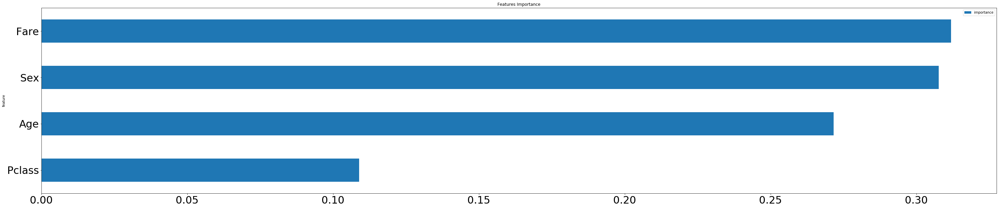

In [51]:
# Random Forest Regressor test

outcome_var = 'Survived'
model = RandomForestRegressor(n_estimators=100,oob_score=True)
predictor_var = ['Pclass','Sex','Age','Fare']

classification_model_RanForest(model, titanic_df,predictor_var,outcome_var)
features_importance(model, titanic_df,predictor_var,outcome_var)

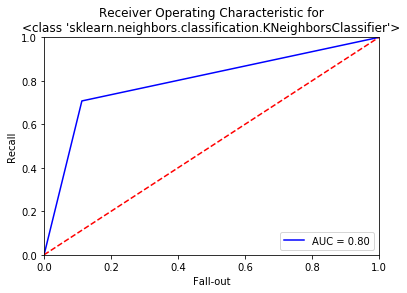

              precision    recall  f1-score   support

           0       0.83      0.89      0.86       549
           1       0.80      0.71      0.75       342

   micro avg       0.82      0.82      0.82       891
   macro avg       0.81      0.80      0.80       891
weighted avg       0.82      0.82      0.82       891

*************************************************************
Metric Performance of : <class 'sklearn.neighbors.classification.KNeighborsClassifier'>

Confusion Matrix : 
 [[487  62]
 [100 242]]

F1 Score :  74.923%
Accuracy : 81.818%
Precision : 70.760%
Recall : 79.605%
Cross Validation Score = 69.144%

Coefficient of determination:0.231
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.83      0.87      0.85       494
           1       0.77      0.71      0.74       308

   micro avg       0.81      0.81      0.81       802
   macro avg       0.

In [52]:
# K Nearest Neigbour test

model = KNeighborsClassifier()
predictor_var = ['Pclass','Sex','Age','Fare']
outcome_var = 'Survived'

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)

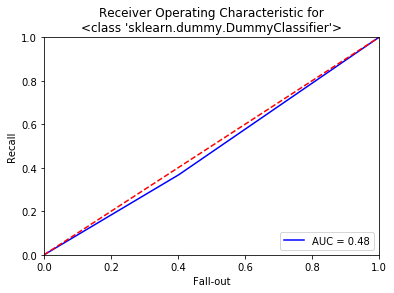

              precision    recall  f1-score   support

           0       0.60      0.60      0.60       549
           1       0.36      0.37      0.37       342

   micro avg       0.51      0.51      0.51       891
   macro avg       0.48      0.48      0.48       891
weighted avg       0.51      0.51      0.51       891

*************************************************************
Metric Performance of : <class 'sklearn.dummy.DummyClassifier'>

Confusion Matrix : 
 [[328 221]
 [216 126]]

F1 Score :  36.575%
Accuracy : 50.954%
Precision : 36.842%
Recall : 36.311%
Cross Validation Score = 53.533%

Coefficient of determination:-1.074
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.64      0.65      0.64       502
           1       0.40      0.39      0.39       300

   micro avg       0.55      0.55      0.55       802
   macro avg       0.52      0.52      0.52 

In [53]:
# Dummy test

model = DummyClassifier(strategy='stratified') # strategy in ['stratified', 'most_frequent', 'prior', 'uniform']
predictor_var = ['Pclass','Sex','Age','Fare']
outcome_var = 'Survived'

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)

#       <h1><center>IV - Hyperparameters tuning</center></h1>             

In [54]:
#=========================================================================
# As reference to the Modeling test results that Random Forest Classifier
# with all the 7 features shows the best highest performance,
# Hence we will be using a Random Forest model for the Hyperparameters 
# tuning
#=========================================================================

In [55]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV

outcome = 'Survived'
predictors = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']

n_range = range(49,54) # default test [50, 10]
max_depth_range = range(12,22) # default test [4, 6, 8]

parameter_grid = {
                 'max_depth' : max_depth_range,
                 'n_estimators':n_range ,
                 'max_features': ['sqrt', 'auto', 'log2'],
                 'min_samples_split': [2],
                 'min_samples_leaf': [1],
                 'bootstrap': [True, False],
                 }
    
forest = RandomForestClassifier()
cross_validation = StratifiedKFold(n_splits=5)

grid_search = GridSearchCV(forest,
                           scoring='accuracy',
                           param_grid=parameter_grid,
                           cv=cross_validation,
                           verbose=1,
                           n_jobs=-1
                           )

grid_search.fit(titanic_df[predictors], titanic_df[outcome])
model = grid_search
parameters = grid_search.best_params_



Fitting 5 folds for each of 300 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed:   17.1s
[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed:   20.4s finished


In [57]:
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))
model = RandomForestClassifier(**parameters)
model.fit(titanic_df[predictors], titanic_df[outcome])

Best score: 0.8383838383838383
Best parameters: {'bootstrap': True, 'max_depth': 12, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 53}


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=12, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=53, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

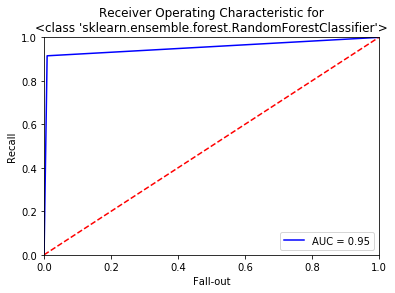

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       549
           1       0.98      0.92      0.95       342

   micro avg       0.96      0.96      0.96       891
   macro avg       0.97      0.95      0.96       891
weighted avg       0.96      0.96      0.96       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestClassifier'>

Confusion Matrix : 
 [[544   5]
 [ 29 313]]

F1 Score :  94.848%
Accuracy : 96.184%
Precision : 91.520%
Recall : 98.428%
Cross Validation Score = 82.388%

Coefficient of determination:0.839
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       488
           1       0.99      0.90      0.94       314

   micro avg       0.96      0.96      0.96       802
   macro avg       0.96     

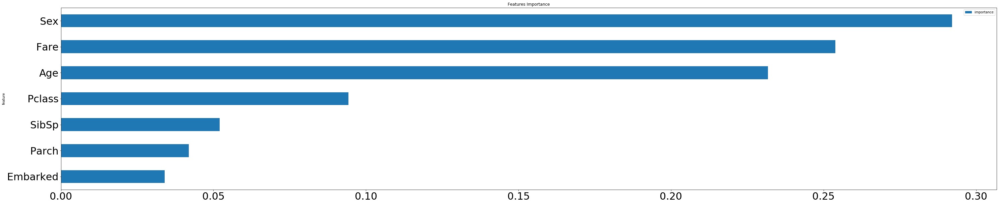

In [58]:
predictor_var = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
outcome_var = 'Survived'

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)
features_importance(model, titanic_df,predictor_var,outcome_var)

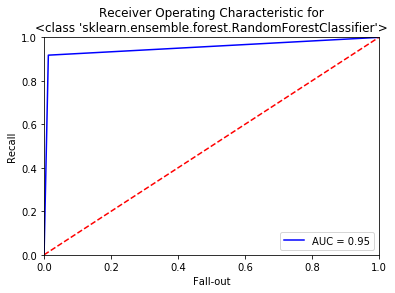

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       549
           1       0.98      0.92      0.95       342

   micro avg       0.96      0.96      0.96       891
   macro avg       0.96      0.95      0.96       891
weighted avg       0.96      0.96      0.96       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestClassifier'>

Confusion Matrix : 
 [[542   7]
 [ 28 314]]

F1 Score :  94.721%
Accuracy : 96.072%
Precision : 91.813%
Recall : 97.819%
Cross Validation Score = 82.607%

Coefficient of determination:0.834
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       486
           1       0.98      0.94      0.96       316

   micro avg       0.97      0.97      0.97       802
   macro avg       0.97     

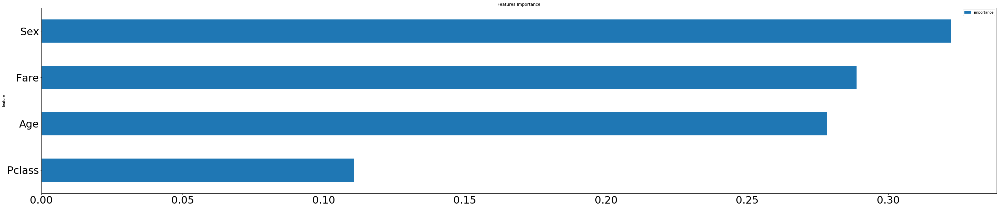

In [59]:
predictor_var = ['Pclass','Sex','Age','Fare']
outcome_var = 'Survived'

classification_model_RanTree(model, titanic_df,predictor_var,outcome_var)
features_importance(model, titanic_df,predictor_var,outcome_var)

In [60]:
# Search for a optimal value of n_estimator for RandomForestClassifier
predictor = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
outcome = 'Survived'

n_range = range(40,60)
n_scores = []
for n in n_range:
    RandomClf = RandomForestClassifier(n_estimators=n)
    scores = cross_val_score(RandomClf, titanic_df[predictor],titanic_df[outcome], cv = 10, scoring='accuracy')
    n_scores.append(scores.mean())
    
print(n_scores)
print(max(n_scores))
print(n_scores.index(max(n_scores))+40)
print(model)

[0.8127054250368857, 0.8059891045284304, 0.8093346385200316, 0.8093471229145386, 0.8071251844285552, 0.8081855067529226, 0.8093346385200318, 0.8104451821586652, 0.8160759278175009, 0.8059760526614459, 0.8149276472591079, 0.8070999319033026, 0.8138667574622632, 0.8115438088752697, 0.8037665985699693, 0.8037288616502101, 0.817225343320849, 0.8126676881171264, 0.8037665985699693, 0.8093845760980592]
0.817225343320849
56
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=12, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=53, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)


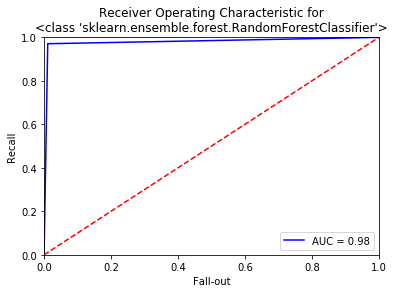

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       549
           1       0.98      0.97      0.98       342

   micro avg       0.98      0.98      0.98       891
   macro avg       0.98      0.98      0.98       891
weighted avg       0.98      0.98      0.98       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestClassifier'>

Confusion Matrix : 
 [[543   6]
 [ 10 332]]

F1 Score :  97.647%
Accuracy : 98.204%
Precision : 97.076%
Recall : 98.225%
Cross Validation Score = 81.377%

Coefficient of determination:0.924
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       495
           1       0.98      0.97      0.98       307

   micro avg       0.98      0.98      0.98       802
   macro avg       0.98     

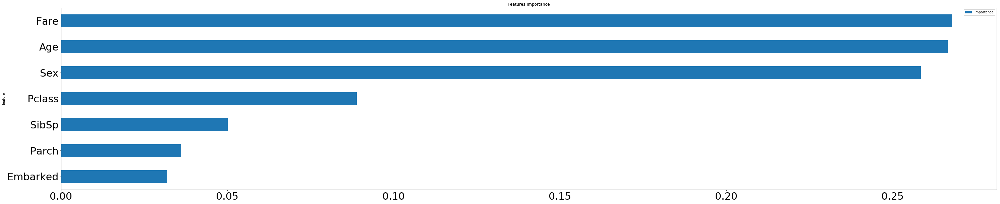

In [61]:
model = RandomForestClassifier(n_estimators=58)
classification_model_RanTree(model, titanic_df,predictor,outcome)
features_importance(model, titanic_df,predictor,outcome)

Text(0, 0.5, 'Cross Validated Accuracy')

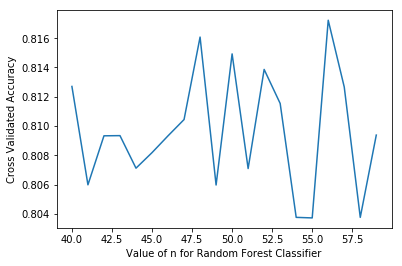

In [62]:
plt.plot(n_range, n_scores)
plt.xlabel('Value of n for Random Forest Classifier')
plt.ylabel('Cross Validated Accuracy')

In [63]:
# Search for a optimal value of max_depth_range for RandomForestClassifier
predictor = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
outcome = 'Survived'

n_range = range(5,15)
n_scores = []
for n in n_range:
    RandomClf = RandomForestClassifier(max_depth=n,n_estimators=58)
    scores = cross_val_score(RandomClf, titanic_df[predictor],titanic_df[outcome], cv = 10, scoring='accuracy')
    n_scores.append(scores.mean())
    
print(n_scores)
print(max(n_scores))
print(n_scores.index(max(n_scores))+5)

[0.8250278061514017, 0.8249897854954036, 0.8294716831233686, 0.8373368516626944, 0.8339910339348542, 0.8283858245375099, 0.8317940642378845, 0.8339913176710929, 0.8171873226648507, 0.8138293042787426]
0.8373368516626944
8


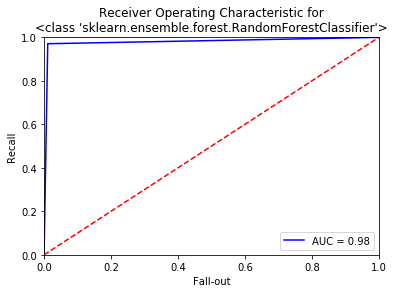

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       549
           1       0.98      0.97      0.98       342

   micro avg       0.98      0.98      0.98       891
   macro avg       0.98      0.98      0.98       891
weighted avg       0.98      0.98      0.98       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestClassifier'>

Confusion Matrix : 
 [[543   6]
 [ 10 332]]

F1 Score :  97.647%
Accuracy : 98.204%
Precision : 97.076%
Recall : 98.225%
Cross Validation Score = 80.369%

Coefficient of determination:0.924
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       496
           1       0.99      0.97      0.98       306

   micro avg       0.98      0.98      0.98       802
   macro avg       0.98     

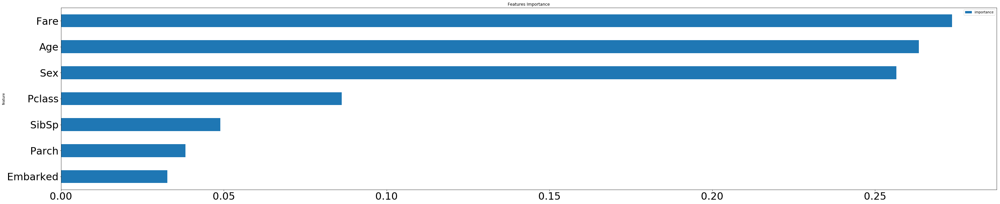

In [64]:
model = RandomForestClassifier(max_depth=21,n_estimators=49)
classification_model_RanTree(model, titanic_df,predictor,outcome)
features_importance(model, titanic_df,predictor,outcome)

Text(0, 0.5, 'Cross Validated Accuracy')

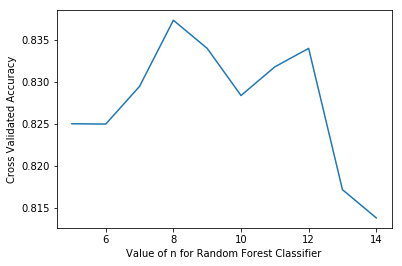

In [65]:
plt.plot(n_range, n_scores)
plt.xlabel('Value of n for Random Forest Classifier')
plt.ylabel('Cross Validated Accuracy')

In [66]:
# Search for a optimal value of min_samples_split for RandomForestClassifier
predictor = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
outcome = 'Survived'

n_range = range(2,11)
n_scores = []
for n in n_range:
    RandomClf = RandomForestClassifier(max_depth=21,n_estimators=49,min_samples_split=n)
    scores = cross_val_score(RandomClf, titanic_df[predictor],titanic_df[outcome], cv = 10, scoring='accuracy')
    n_scores.append(scores.mean())
    
print(n_scores)
print(max(n_scores))
print(n_scores.index(max(n_scores))+2)

[0.8115818295312677, 0.8138287368062649, 0.8261638860515266, 0.8261511179207808, 0.8238789581205312, 0.8339785495403472, 0.8272369765066394, 0.8283855408012712, 0.827211723981387]
0.8339785495403472
7


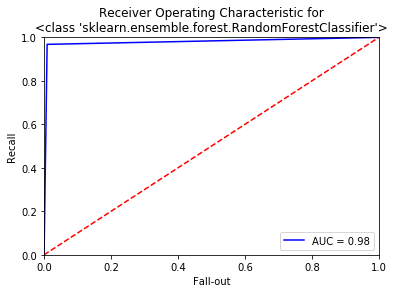

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       549
           1       0.99      0.97      0.98       342

   micro avg       0.98      0.98      0.98       891
   macro avg       0.98      0.98      0.98       891
weighted avg       0.98      0.98      0.98       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestClassifier'>

Confusion Matrix : 
 [[544   5]
 [ 11 331]]

F1 Score :  97.640%
Accuracy : 98.204%
Precision : 96.784%
Recall : 98.512%
Cross Validation Score = 81.147%

Coefficient of determination:0.924
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       492
           1       0.99      0.97      0.98       310

   micro avg       0.98      0.98      0.98       802
   macro avg       0.99     

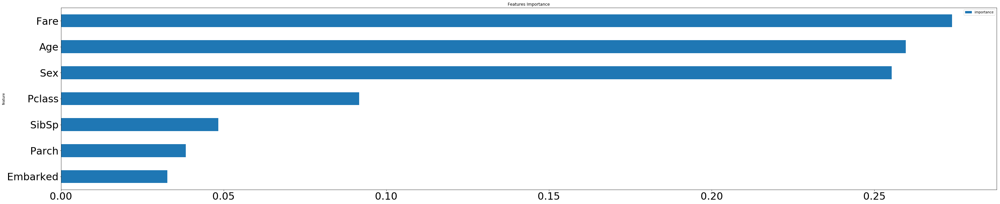

In [67]:
model = RandomForestClassifier(max_depth=21,n_estimators=49,min_samples_split=2)
classification_model_RanTree(model, titanic_df,predictor,outcome)
features_importance(model, titanic_df,predictor,outcome)

Text(0, 0.5, 'Cross Validated Accuracy')

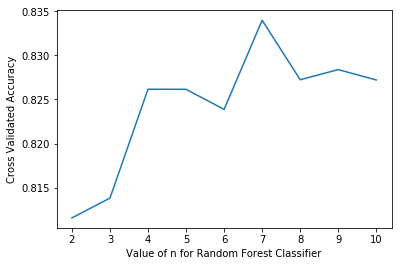

In [68]:
plt.plot(n_range, n_scores)
plt.xlabel('Value of n for Random Forest Classifier')
plt.ylabel('Cross Validated Accuracy')

In [69]:
# Search for a optimal value of min_samples_leaf for RandomForestClassifier
predictor = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
outcome = 'Survived'

n_range = range(1,11)
n_scores = []
for n in n_range:
    RandomClf = RandomForestClassifier(max_depth=21,n_estimators=49,min_samples_split=2,min_samples_leaf=n)
    scores = cross_val_score(RandomClf, titanic_df[predictor],titanic_df[outcome], cv = 10, scoring='accuracy')
    n_scores.append(scores.mean())
    
print(n_scores)
print(max(n_scores))
print(n_scores.index(max(n_scores))+1)

[0.8127057087731245, 0.8295094200431279, 0.8295219044376347, 0.8261383497900352, 0.8239416638293042, 0.8317188741346044, 0.8272494609011464, 0.8194092611508342, 0.8227425944841675, 0.8249773011008965]
0.8317188741346044
6


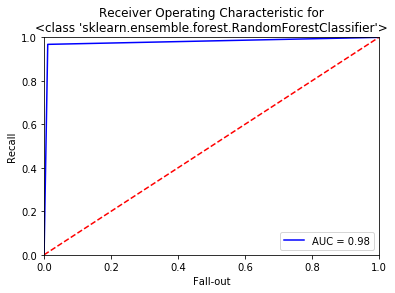

              precision    recall  f1-score   support

           0       0.98      0.99      0.98       549
           1       0.98      0.97      0.97       342

   micro avg       0.98      0.98      0.98       891
   macro avg       0.98      0.98      0.98       891
weighted avg       0.98      0.98      0.98       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestClassifier'>

Confusion Matrix : 
 [[543   6]
 [ 11 331]]

F1 Score :  97.496%
Accuracy : 98.092%
Precision : 96.784%
Recall : 98.220%
Cross Validation Score = 80.253%

Coefficient of determination:0.919
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       501
           1       0.97      0.98      0.98       301

   micro avg       0.98      0.98      0.98       802
   macro avg       0.98     

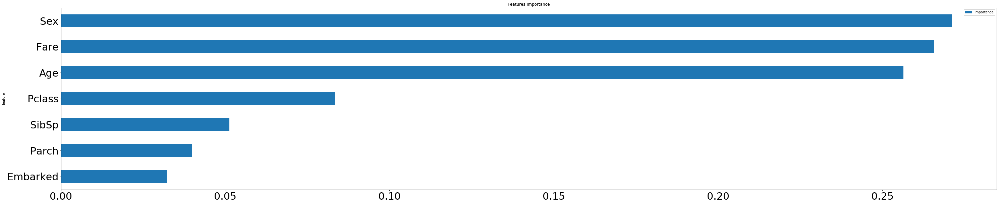

In [70]:
model = RandomForestClassifier(max_depth=21,n_estimators=53,min_samples_split=2,min_samples_leaf=1)
classification_model_RanTree(model, titanic_df,predictor,outcome)
features_importance(model, titanic_df,predictor,outcome)

Text(0, 0.5, 'Cross Validated Accuracy')

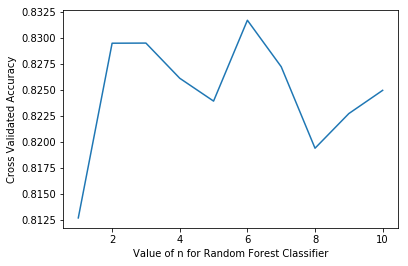

In [71]:
plt.plot(n_range, n_scores)
plt.xlabel('Value of n for Random Forest Classifier')
plt.ylabel('Cross Validated Accuracy')

In [72]:
# Search for a optimal value of max_features for RandomForestClassifier
predictor = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
outcome = 'Survived'

n_range = ['sqrt', 'auto', 'log2']
n_scores = []

for idx, n in enumerate(n_range):
    RandomClf = RandomForestClassifier(max_depth=21,n_estimators=49,min_samples_split=2,min_samples_leaf=1,max_features=n)
    scores = cross_val_score(RandomClf, titanic_df[predictor],titanic_df[outcome], cv = 10, scoring='accuracy')
    n_scores.append(scores.mean())
    
print(n_scores)
print(max(n_scores))
print(n_scores.index(max(n_scores))+1)

[0.8127179094313925, 0.8071495857450912, 0.800370559527863]
0.8127179094313925
1


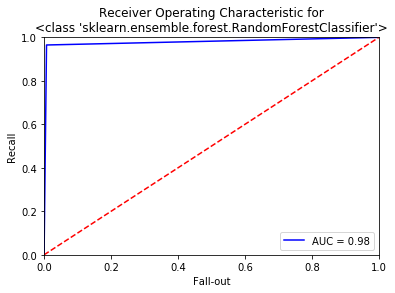

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       549
           1       0.99      0.96      0.98       342

   micro avg       0.98      0.98      0.98       891
   macro avg       0.98      0.98      0.98       891
weighted avg       0.98      0.98      0.98       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestClassifier'>

Confusion Matrix : 
 [[545   4]
 [ 12 330]]

F1 Score :  97.633%
Accuracy : 98.204%
Precision : 96.491%
Recall : 98.802%
Cross Validation Score = 81.151%

Coefficient of determination:0.924
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       492
           1       0.98      0.98      0.98       310

   micro avg       0.98      0.98      0.98       802
   macro avg       0.98     

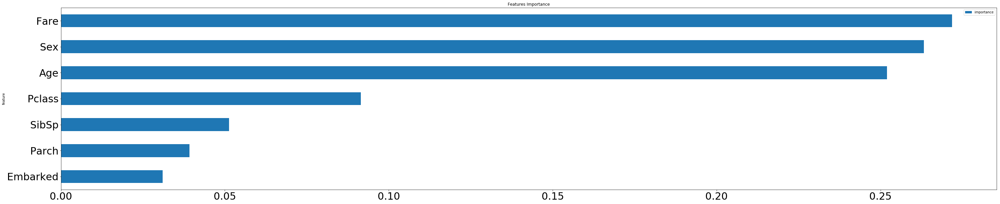

In [73]:
model = RandomForestClassifier(max_depth=21,n_estimators=49,min_samples_split=2,min_samples_leaf=1,max_features='log2')
classification_model_RanTree(model, titanic_df,predictor,outcome)
features_importance(model, titanic_df,predictor,outcome)

Text(0, 0.5, 'Cross Validated Accuracy')

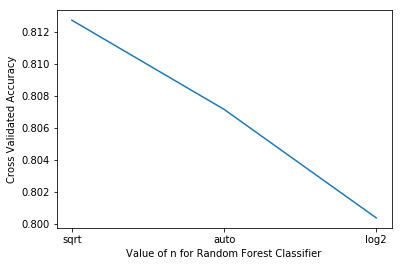

In [74]:
plt.plot(n_range, n_scores)
plt.xlabel('Value of n for Random Forest Classifier')
plt.ylabel('Cross Validated Accuracy')


#       <h1><center>V - Saving the trained Model</center></h1>  


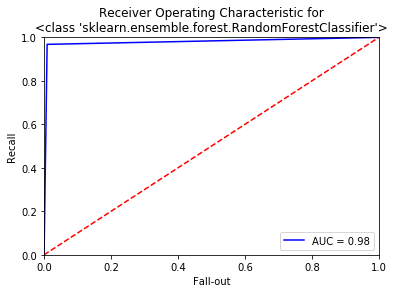

              precision    recall  f1-score   support

           0       0.98      0.99      0.99       549
           1       0.99      0.97      0.98       342

   micro avg       0.98      0.98      0.98       891
   macro avg       0.98      0.98      0.98       891
weighted avg       0.98      0.98      0.98       891

*************************************************************
Metric Performance of : <class 'sklearn.ensemble.forest.RandomForestClassifier'>

Confusion Matrix : 
 [[544   5]
 [ 11 331]]

F1 Score :  97.640%
Accuracy : 98.204%
Precision : 96.784%
Recall : 98.512%
Cross Validation Score = 80.251%

Coefficient of determination:0.924
*************************************************************
KFold Classification Report : 
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       494
           1       0.99      0.97      0.98       308

   micro avg       0.98      0.98      0.98       802
   macro avg       0.98     

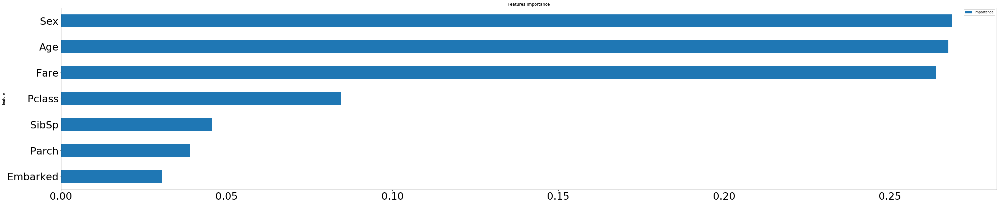

In [75]:
# We can save the trained model clf using pickle 
import pickle

model = RandomForestClassifier(max_depth=21,n_estimators=49,min_samples_split=2,min_samples_leaf=1,max_features='log2')
predictors = ['Pclass','Sex','Age','SibSp','Parch','Fare','Embarked']
outcome = 'Survived'
model.fit(titanic_df[predictors],titanic_df[outcome])

classification_model_RanTree(model, titanic_df,predictor,outcome)
features_importance(model, titanic_df,predictor,outcome)

s = pickle.dumps(model)
pickle.dump( model, open( "Titanic_trained_model.p", "wb" ) )
model2 = pickle.load( open( "Titanic_trained_model.p", "rb" ) )

# Alternatively, we can save the trained model clf with sklearn joblib
from sklearn.externals import joblib
joblib.dump(model, 'Titanic_trained_model.pkl') 
model3 = joblib.load('Titanic_trained_model.pkl')

In [76]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(max_depth=12,n_estimators=49,min_samples_split=2,min_samples_leaf=1,max_features='log2')
clf = clf.fit(titanic_df[predictors],titanic_df[outcome])

estimator_nonlimited = clf.estimators_[7]
outcome

'Survived'

In [81]:
from sklearn import tree
from sklearn.tree import export_graphviz

export_graphviz(estimator_nonlimited, out_file='tree_nonlimited.dot', feature_names = titanic_df[predictors].columns,
                class_names = outcome,
                rounded = True, proportion = False, precision = 2, filled = True)

!dot -Tpng tree_nonlimited.dot -o tree_nonlimited.png -Gdpi=300
from IPython.display import Image
Image(filename = 'tree_nonlimited.png')

In [82]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(max_depth=4,n_estimators=49,min_samples_split=2,min_samples_leaf=1,max_features='log2')
clf = clf.fit(titanic_df[predictors],titanic_df[outcome])

estimator_limited = clf.estimators_[7]

from sklearn import tree
from sklearn.tree import export_graphviz

export_graphviz(estimator_limited, out_file='tree_limited_to_4.dot', feature_names = titanic_df[predictors].columns,
                class_names = outcome,
                rounded = True, proportion = False, precision = 2, filled = True)

!dot -Tpng tree_limited_to_4.dot -o tree_limited_to_4.png -Gdpi=600
from IPython.display import Image
Image(filename = 'tree_limited_to_4.png')

#       <h1><center> VI - Submission of test data and results</center></h1>            

In [83]:
titanic_test =pd.read_csv('test.csv', sep=',')

# Processing the test ages
# Age variable was missing 177 values. This is a large number. Simply 
# replacing them with the mean age 
# To avoid data leakage from the test set, we fill in missing ages in the train 
# using the train set and we fill in ages in the test set using values 
# calculated from the train set as well

print(titanic_test['Age'].isnull().sum())
# replace ns with the mean value
titanic_test['Age'].fillna(titanic_test['Age'].mean(), inplace=True)

titanic_test.count()

86


PassengerId    418
Pclass         418
Name           418
Sex            418
Age            418
SibSp          418
Parch          418
Ticket         418
Fare           417
Cabin           91
Embarked       418
dtype: int64

In [84]:
# Processing the test Fare
# Embarked variable has missing 2 values. This is a small number. Simply 
# replacing them with the mode age 
# To avoid data leakage from the test set, we fill in missing ages in the train 
# using the train set and we fill in ages in the test set using values 
# calculated from the train set as well

print(titanic_test['Fare'].isnull().sum())
# replace ns with the mean value
titanic_test['Fare'].fillna(titanic_test['Fare'].mean(), inplace=True)

titanic_test.count()


1


PassengerId    418
Pclass         418
Name           418
Sex            418
Age            418
SibSp          418
Parch          418
Ticket         418
Fare           418
Cabin           91
Embarked       418
dtype: int64

In [85]:
# For test data
from sklearn.preprocessing import LabelEncoder
var_mod = ['Pclass','Sex','Embarked']
le = LabelEncoder()
for i in var_mod:
    titanic_test[i] = le.fit_transform(titanic_test[i])
titanic_test.dtypes 

PassengerId      int64
Pclass           int64
Name            object
Sex              int32
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked         int32
dtype: object

In [86]:
# Since Cabin has large numbers of missing values, in  
# test data set , we will drop this column
# As PassengerId, Name and Ticket Number will not make sense as a 
# affecting factor to the survival rate

titanic_for_test = titanic_test.drop(['PassengerId','Name','Ticket','Cabin'], axis=1)

In [87]:
titanic_for_test.head(10)

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,2,1,34.5,0,0,7.8292,1
1,2,0,47.0,1,0,7.0000,2
2,1,1,62.0,0,0,9.6875,1
3,2,1,27.0,0,0,8.6625,2
4,2,0,22.0,1,1,12.2875,2
5,2,1,14.0,0,0,9.2250,2
6,2,0,30.0,0,0,7.6292,1
7,1,1,26.0,1,1,29.0000,2
8,2,0,18.0,0,0,7.2292,0
9,2,1,21.0,2,0,24.1500,2


In [88]:
# Load the classifier model
import pickle

final_model = pickle.load( open( "Titanic_trained_model.p", "rb" ) )

# Now run on test data
# Make predictions on test set:
predictions = final_model.predict(titanic_for_test)

titanic_test['PassengerId'] = pd.DataFrame(titanic_test['PassengerId'])
titanic_test['Survived'] = predictions


In [89]:
titanic_test.head(10)

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,892,2,"Kelly, Mr. James",1,34.5,0,0,330911,7.8292,NaN,1,0
1,893,2,"Wilkes, Mrs. James (Ellen Needs)",0,47.0,1,0,363272,7.0000,NaN,2,0
2,894,1,"Myles, Mr. Thomas Francis",1,62.0,0,0,240276,9.6875,NaN,1,0
3,895,2,"Wirz, Mr. Albert",1,27.0,0,0,315154,8.6625,NaN,2,1
4,896,2,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",0,22.0,1,1,3101298,12.2875,NaN,2,0
5,897,2,"Svensson, Mr. Johan Cervin",1,14.0,0,0,7538,9.2250,NaN,2,0
6,898,2,"Connolly, Miss. Kate",0,30.0,0,0,330972,7.6292,NaN,1,0
7,899,1,"Caldwell, Mr. Albert Francis",1,26.0,1,1,248738,29.0000,NaN,2,0
8,900,2,"Abrahim, Mrs. Joseph (Sophie Halaut Easu)",0,18.0,0,0,2657,7.2292,NaN,0,1
9,901,2,"Davies, Mr. John Samuel",1,21.0,2,0,A/4 48871,24.1500,NaN,2,0


In [90]:
import csv

# Create a new excel workbook
writer = pd.ExcelWriter('Lum Kok Keong P7320307 - Titanic_test_predictions.xlsx', engine='xlsxwriter')

titanic_test.to_excel(writer, sheet_name='Titanic Test Results')

# Close the Pandas Excel writer and output the Excel file.
writer.save()